# Customer-Analysis
A well known company with numerous products needs to analyze their customer behavior and classify them whether they will accept the campaigns held by the company. 

# Step 1: Data Collection and Understanding

collecting historical data relevant to your problem.Understand the dataset's structure, variables, and meaning.
Highlight any missing data or inconsistencies.

# Importing libraries

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

 # Data Collection and Understanding:

In [3]:
df = pd.read_csv("C:\\Users\\franc\\Desktop\\capstone project\\customer_train.csv")
df.head()

,Unnamed: 0.1,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,0,0,5524,1957,S1,Lajang,58138000.0,0,0,04-09-2012,...,7,0,0,0,0,0,0,3,11,1
1,1,1,2174,1954,S1,Lajang,46344000.0,1,1,08-03-2014,...,5,0,0,0,0,0,0,3,11,0
2,2,2,4141,1965,S1,Bertunangan,71613000.0,0,0,21-08-2013,...,4,0,0,0,0,0,0,3,11,0
3,3,3,6182,1984,S1,Bertunangan,26646000.0,1,0,10-02-2014,...,6,0,0,0,0,0,0,3,11,0
4,4,4,5324,1981,S3,Menikah,58293000.0,1,0,19-01-2014,...,5,0,0,0,0,0,0,3,11,0



About dataset:
People

    ID: Customer's unique identifier
    Year_Birth: Customer's birth year
    Education: Customer's education level
    Marital_Status: Customer's marital status
    Income: Customer's yearly household income
    Kidhome: Number of children in customer's household
    Teenhome: Number of teenagers in customer's household
    Dt_Customer: Date of customer's enrollment with the company
    Recency: Number of days since customer's last purchase
    Complain: 1 if the customer complained in the last 2 years, 0 otherwise

Products

    MntWines: Amount spent on wine in last 2 years
    MntFruits: Amount spent on fruits in last 2 years
    MntMeatProducts: Amount spent on meat in last 2 years
    MntFishProducts: Amount spent on fish in last 2 years
    MntSweetProducts: Amount spent on sweets in last 2 years
    MntGoldProds: Amount spent on gold in last 2 years

Promotion

    NumDealsPurchases: Number of purchases made with a discount
    AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
    AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
    AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
    AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
    AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
    Response: 1 if customer accepted the offer in the last campaign, 0 otherwise

Place

    NumWebPurchases: Number of purchases made through the company’s website
    NumCatalogPurchases: Number of purchases made using a catalogue
    NumStorePurchases: Number of purchases made directly in stores
    NumWebVisitsMonth: Number of visits to company’s website in the last month



In [4]:
df.shape

(1680, 31)

In [5]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'ID', 'Year_Birth', 'Education',
       'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer',
       'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response'],
      dtype='object')

In [6]:
df.dtypes

Unnamed: 0.1             int64
Unnamed: 0               int64
ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntCoke                  int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0.1         1680 non-null   int64  
 1   Unnamed: 0           1680 non-null   int64  
 2   ID                   1680 non-null   int64  
 3   Year_Birth           1680 non-null   int64  
 4   Education            1680 non-null   object 
 5   Marital_Status       1680 non-null   object 
 6   Income               1663 non-null   float64
 7   Kidhome              1680 non-null   int64  
 8   Teenhome             1680 non-null   int64  
 9   Dt_Customer          1680 non-null   object 
 10  Recency              1680 non-null   int64  
 11  MntCoke              1680 non-null   int64  
 12  MntFruits            1680 non-null   int64  
 13  MntMeatProducts      1680 non-null   int64  
 14  MntFishProducts      1680 non-null   int64  
 15  MntSweetProducts     1680 non-null   i

In [8]:
df.describe()

,Unnamed: 0.1,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,1680.000000,1680.000000,1680.000000,1680.000000,1.663000e+03,1680.000000,1680.000000,1680.000000,1.680000e+03,1680.000000,...,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.0,1680.0,1680.000000
mean,839.500000,839.500000,5551.728571,1968.847619,5.201434e+07,0.452381,0.500000,49.083333,3.048994e+05,25918.452381,...,5.332143,0.071429,0.074405,0.069048,0.062500,0.011905,0.010119,3.0,11.0,0.144048
std,485.118542,485.118542,3238.155703,12.027192,2.148248e+07,0.546901,0.550055,28.930637,3.387051e+05,39532.059109,...,2.449814,0.257616,0.262507,0.253611,0.242134,0.108490,0.100113,0.0,0.0,0.351243
min,0.000000,0.000000,0.000000,1893.000000,1.730000e+06,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,419.750000,419.750000,2823.250000,1960.000000,3.568800e+07,0.000000,0.000000,24.000000,2.400000e+04,1000.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,839.500000,839.500000,5381.000000,1970.000000,5.125000e+07,0.000000,0.000000,50.000000,1.730000e+05,8000.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,1259.250000,1259.250000,8370.750000,1977.000000,6.812200e+07,1.000000,1.000000,74.000000,4.942500e+05,32000.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,1679.000000,1679.000000,11191.000000,1996.000000,1.623970e+08,2.000000,2.000000,99.000000,1.492000e+06,199000.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


Selecting specific columns from your DataFrame df and create a new DataFrame with only those selected columns. In the code using the .copy() method to create a new DataFrame with a subset of columns.

In [9]:
# dropping irrevalent columns
df = df[[#'Unnamed: 0.1', 'Unnamed: 0', 'ID', 
       'Year_Birth', 'Education',
       'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer',
       'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 
        #'Z_CostContact', 'Z_Revenue', 
       'Response']].copy()
df.shape

(1680, 26)

In [10]:


df.dtypes



Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntCoke                  int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Response                 int64
dtype: object

In [11]:
# converting datatypes of specific columns
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')
df['Dt_Customer'].head()

0   2012-09-04
1   2014-03-08
2   2013-08-21
3   2014-02-10
4   2014-01-19
Name: Dt_Customer, dtype: datetime64[ns]

In [12]:
# renaming columns
df = df.rename(columns = {'Marital_Status': 'Marital_status',
                    'Kidhome': 'Kids',
                    'Teenhome': 'Teens',
                    'Dt_Customer': 'Enrollment_date',
                    'MntCoke': 'Coke',
                    'MntFruits': 'Fruits',
                    'MntMeatProducts': 'Meat',
                    'MntFishProducts': 'Fish',
                    'MntSweetProducts': 'Sweets',
                    'MntGoldProds': 'Gold',
                    'NumDealsPurchases': 'Purchase_ct_with_deals',
                    'NumCatalogPurchases': 'Catalog_purchase_ct', 
                    'NumStorePurchases': 'Store_purchase_ct',
                    'NumWebPurchases': 'Web_purchase_ct',
                    'NumWebVisitsMonth': 'Web_visits_ct (last_month)',
                    'AcceptedCmp3': 'Cmp3', 
                    'AcceptedCmp4': 'Cmp4', 
                    'AcceptedCmp5': 'Cmp5', 
                    'AcceptedCmp1': 'Cmp1',
                    'AcceptedCmp2': 'Cmp2'})
df.head()

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,...,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
0,1957,S1,Lajang,58138000.0,0,0,2012-09-04,58,635000,88000,...,10,4,7,0,0,0,0,0,0,1
1,1954,S1,Lajang,46344000.0,1,1,2014-03-08,38,11000,1000,...,1,2,5,0,0,0,0,0,0,0
2,1965,S1,Bertunangan,71613000.0,0,0,2013-08-21,26,426000,49000,...,2,10,4,0,0,0,0,0,0,0
3,1984,S1,Bertunangan,26646000.0,1,0,2014-02-10,26,11000,4000,...,0,4,6,0,0,0,0,0,0,0
4,1981,S3,Menikah,58293000.0,1,0,2014-01-19,94,173000,43000,...,3,6,5,0,0,0,0,0,0,0


In [13]:
df['Marital_status'].unique()

array(['Lajang', 'Bertunangan', 'Menikah', 'Cerai', 'Janda', 'Duda'],
      dtype=object)

In [14]:
df['Marital_status'].replace({'Lajang': 'Single', 
                              'Bertunangan': 'Engaged', 
                              'Menikah': 'Married', 
                              'Cerai': ' Divorced', 
                              'Janda': 'Widow', 
                              'Duda': 'Widower'}, inplace=True)

In [15]:
df['Marital_status'].head()

0     Single
1     Single
2    Engaged
3    Engaged
4    Married
Name: Marital_status, dtype: object

In [16]:
# to find duplicate columns
df.duplicated().sum()

109

In [17]:
df.loc[df.duplicated()]

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,...,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
83,1963,S2,Engaged,38620000.0,0,0,2013-05-11,56,112000,17000,...,5,3,3,0,0,0,0,0,0,0
179,1951,D3,Married,78497000.0,0,0,2013-12-01,44,207000,26000,...,7,12,2,0,0,0,1,0,0,0
281,1976,S1,Engaged,51369000.0,0,1,2012-10-25,84,297000,7000,...,2,4,8,0,0,0,0,0,0,0
282,1946,S1,Engaged,37760000.0,0,0,2012-08-31,20,84000,5000,...,1,6,7,0,0,0,0,0,0,0
363,1978,S3,Married,37717000.0,1,0,2012-11-23,31,9000,0,...,0,2,9,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1643,1979,SMA,Engaged,24594000.0,1,0,2013-12-10,94,1000,3000,...,0,3,5,0,0,0,0,0,0,0
1664,1989,S3,Single,33996000.0,0,0,2013-09-11,46,40000,2000,...,1,3,4,0,0,0,0,0,0,0
1668,1970,S3,Married,69084000.0,1,0,2013-11-19,43,1181000,107000,...,3,13,8,0,0,0,0,0,0,0
1669,1967,S3,Married,77766000.0,0,1,2013-02-22,97,1004000,59000,...,10,11,6,1,0,0,0,0,0,1


In [18]:
df = df.loc[~df.duplicated()].reset_index(drop=True)

In [19]:


df.duplicated().sum()



0

In [20]:
df.isna().sum()

Year_Birth                     0
Education                      0
Marital_status                 0
Income                        17
Kids                           0
Teens                          0
Enrollment_date                0
Recency                        0
Coke                           0
Fruits                         0
Meat                           0
Fish                           0
Sweets                         0
Gold                           0
Purchase_ct_with_deals         0
Web_purchase_ct                0
Catalog_purchase_ct            0
Store_purchase_ct              0
Web_visits_ct (last_month)     0
Cmp3                           0
Cmp4                           0
Cmp5                           0
Cmp1                           0
Cmp2                           0
Complain                       0
Response                       0
dtype: int64

In [21]:


df.loc[df['Income'].isna(), 'Income'] = df['Income'].median()



In [22]:
df.isna().sum()

Year_Birth                    0
Education                     0
Marital_status                0
Income                        0
Kids                          0
Teens                         0
Enrollment_date               0
Recency                       0
Coke                          0
Fruits                        0
Meat                          0
Fish                          0
Sweets                        0
Gold                          0
Purchase_ct_with_deals        0
Web_purchase_ct               0
Catalog_purchase_ct           0
Store_purchase_ct             0
Web_visits_ct (last_month)    0
Cmp3                          0
Cmp4                          0
Cmp5                          0
Cmp1                          0
Cmp2                          0
Complain                      0
Response                      0
dtype: int64

In [23]:
df.describe()

,Year_Birth,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,...,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
count,1571.000000,1.571000e+03,1571.000000,1571.000000,1571,1571.000000,1.571000e+03,1571.000000,1.571000e+03,1571.000000,...,1571.000000,1571.000000,1571.000000,1571.000000,1571.000000,1571.00000,1571.000000,1571.000000,1571.000000,1571.000000
mean,1968.831318,5.195792e+07,0.457034,0.504137,2013-07-10 22:36:35.289624320,48.624443,3.028109e+05,25746.658180,1.651610e+05,36532.145130,...,2.656270,5.774666,5.336092,0.070656,0.075748,0.06620,0.061744,0.011458,0.010185,0.145767
min,1893.000000,1.730000e+06,0.000000,0.000000,2012-07-30 00:00:00,0.000000,0.000000e+00,0.000000,1.000000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,1960.000000,3.582850e+07,0.000000,0.000000,2013-01-17 00:00:00,24.000000,2.300000e+04,1000.000000,1.600000e+04,3000.000000,...,0.000000,3.000000,3.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,1970.000000,5.125850e+07,0.000000,0.000000,2013-07-11 00:00:00,49.000000,1.720000e+05,8000.000000,6.700000e+04,12000.000000,...,2.000000,5.000000,6.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
75%,1977.000000,6.754100e+07,1.000000,1.000000,2013-12-29 00:00:00,74.000000,4.925000e+05,32000.000000,2.275000e+05,46500.000000,...,4.000000,8.000000,7.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
max,1996.000000,1.623970e+08,2.000000,2.000000,2014-06-29 00:00:00,99.000000,1.492000e+06,199000.000000,1.725000e+06,259000.000000,...,28.000000,13.000000,20.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000
std,12.025406,2.137153e+07,0.545888,0.551040,NaN,28.971548,3.367711e+05,39449.614482,2.252443e+05,53960.926691,...,2.977237,3.239508,2.457867,0.256330,0.264679,0.24871,0.240767,0.106459,0.100436,0.352985


## Feature Understanding

In [24]:
df.head()

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,...,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
0,1957,S1,Single,58138000.0,0,0,2012-09-04,58,635000,88000,...,10,4,7,0,0,0,0,0,0,1
1,1954,S1,Single,46344000.0,1,1,2014-03-08,38,11000,1000,...,1,2,5,0,0,0,0,0,0,0
2,1965,S1,Engaged,71613000.0,0,0,2013-08-21,26,426000,49000,...,2,10,4,0,0,0,0,0,0,0
3,1984,S1,Engaged,26646000.0,1,0,2014-02-10,26,11000,4000,...,0,4,6,0,0,0,0,0,0,0
4,1981,S3,Married,58293000.0,1,0,2014-01-19,94,173000,43000,...,3,6,5,0,0,0,0,0,0,0


### Demographic Insights:

- What is the distribution of customers' birth years (Year_Birth)?
- What is the distribution of customers' education levels (Education)?
- What is the distribution of customers' marital statuses (Marital_Status)?
- How is the household income (Income) distributed among customers?

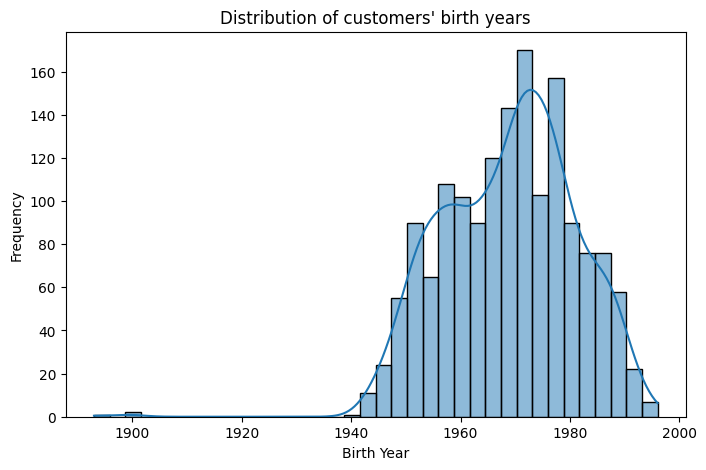

In [25]:
plt.figure(figsize=(8,5))

sns.histplot(df['Year_Birth'], kde=True)
plt.xlabel('Birth Year')
plt.ylabel('Frequency')
plt.title("Distribution of customers' birth years")

plt.show()

In [26]:
# iqr method
q1 = df.Year_Birth.quantile(0.25)
q3 = df.Year_Birth.quantile(0.75)

iqr = q3-q1
iqr

17.0

In [28]:
lower = q1 - 1.5*iqr
upper = q3 + 1.5*iqr

# outliers
df[(df.Year_Birth<lower) | (df.Year_Birth>upper)][['Year_Birth']].head()

,Year_Birth
190,1900
237,1893
335,1899


In [29]:
df_iqr = df[(df.Year_Birth>lower) & (df.Year_Birth<upper)]

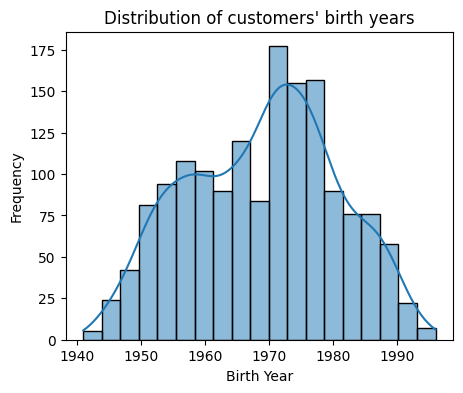

In [30]:
plt.figure(figsize=(5,4))

sns.histplot(df_iqr['Year_Birth'], kde=True)
plt.xlabel('Birth Year')
plt.ylabel('Frequency')
plt.title("Distribution of customers' birth years")

plt.show()

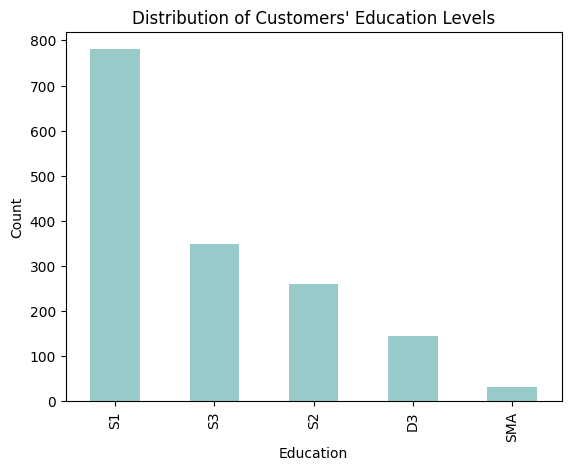

In [31]:
ax = df_iqr['Education'].value_counts() \
    .plot(kind='bar', 
          title="Distribution of Customers' Education Levels",
          color='#98caca')
ax.set_xlabel('Education')
ax.set_ylabel('Count')
plt.show()

In Indonesian, the values ['S1', 'S3', 'S2', 'SMA', 'D3'] typically represent different levels of education.

    S1: This refers to "Strata 1" or the first level of higher education, equivalent to a Bachelor's degree (Sarjana/Sarjana/S1).

    S3: "Strata 3" represents the third level of higher education, which typically corresponds to a Doctorate or PhD (Doktor/S3).

    S2: "Strata 2" denotes the second level of higher education, usually a Master's degree (Magister/S2).

    SMA: "Sekolah Menengah Atas" refers to high school or upper secondary education. It is the stage of education following junior high school (SMP) and preceding higher education.

    D3: "Diploma 3" signifies a three-year diploma program at the tertiary level, which is shorter than a Bachelor's degree program but still a form of higher education.



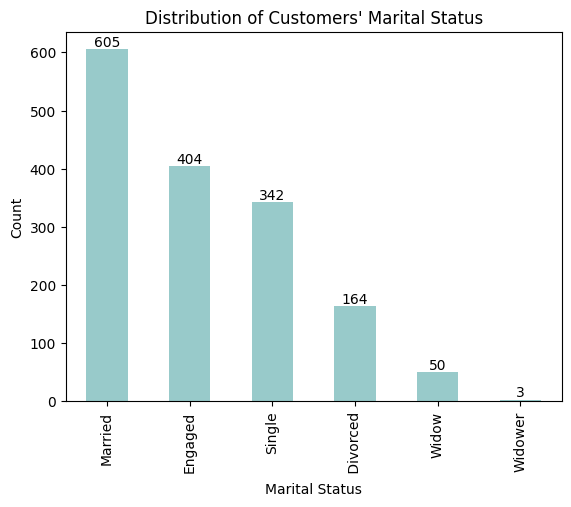

In [32]:
ax = df_iqr['Marital_status'].value_counts() \
    .plot(kind='bar', 
          title="Distribution of Customers' Marital Status",
          color='#98caca')
ax.set_xlabel('Marital Status')
ax.set_ylabel('Count')

# Annotate each bar with its count
for i, count in enumerate(df_iqr['Marital_status'].value_counts()):
    ax.text(i, count, str(count), ha='center', va='bottom')

plt.show()

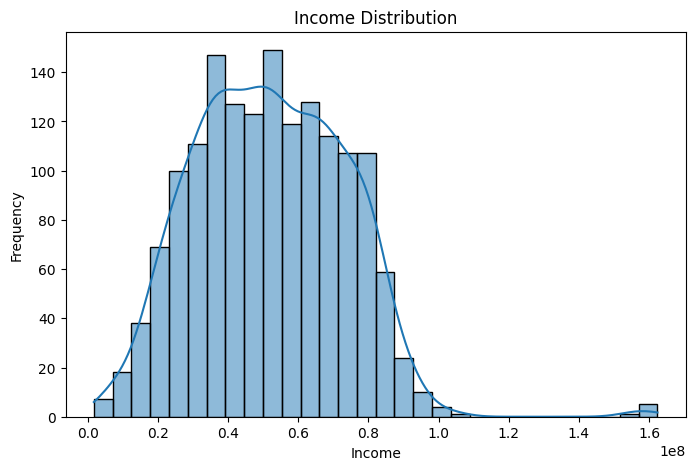

In [33]:
plt.figure(figsize=(8,5))

sns.histplot(df_iqr['Income'], kde=True)
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.title('Income Distribution')

plt.show()

In [34]:
from scipy.stats import skew, kurtosis
df['Income'].skew()

0.427422272151271

<div class="alert alert-block alert-info">
skewness between -0.5 and 0.5 are considered fairly symmetrical
</div>

In [35]:
kurtosis(df['Income'], fisher=False)

4.155091897715247



Kurtosis > 3 is Leptokurtic; meaning it has heavier tails than a normal distribution

In our case, a heavier positive tail; indicating presence of higher frequency of high income customers


High-income customers should not be removed from the analysis for the following reasons:

1. **Diverse Customer Base**: High-income customers represent a valuable segment within our diverse customer base. Their behavior and response patterns provide important insights for analysis, and excluding them may lead to an incomplete understanding of our customer base.

2. **Potential for Targeted Campaigns**: High-income customers can be a prime target audience for specific campaigns, especially for premium products or services. Understanding their behavior helps tailor campaigns that are more likely to appeal to them.

3. **Data Integrity**: Removing high-income customers as outliers may result in data loss, potentially impacting the representativeness of our analysis. Preserving data integrity is crucial for meaningful results.

4. **Alignment with Business Strategy**: Excluding high-income customers may not align with our business goal of engaging and expanding our customer base within this group.

In summary, retaining high-income customers in our analysis enhances our ability to understand customer behavior and effectively classify campaign acceptance.

## Feature Relationship¶

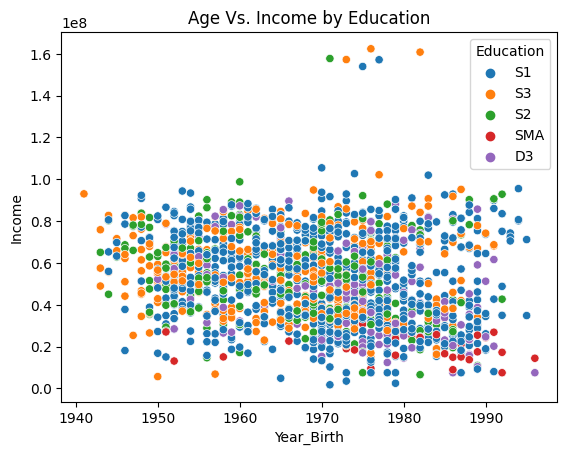

In [36]:
sns.scatterplot(x='Year_Birth', y='Income', data=df_iqr, hue='Education')
plt.title('Age Vs. Income by Education')
plt.show()

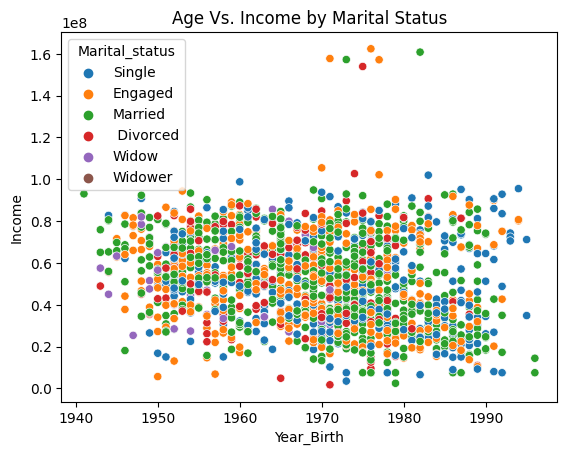

In [37]:
sns.scatterplot(x='Year_Birth', y='Income', data=df_iqr, hue='Marital_status')
plt.title('Age Vs. Income by Marital Status')
plt.show()

In [38]:
df_iqr['Total_amount'] = df_iqr['Coke'] + df_iqr['Fruits'] + df_iqr['Meat'] + df_iqr['Fish'] + df_iqr['Sweets'] + df_iqr['Gold']

C:\Users\franc\AppData\Local\Temp\ipykernel_20412\935834045.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iqr['Total_amount'] = df_iqr['Coke'] + df_iqr['Fruits'] + df_iqr['Meat'] + df_iqr['Fish'] + df_iqr['Sweets'] + df_iqr['Gold']


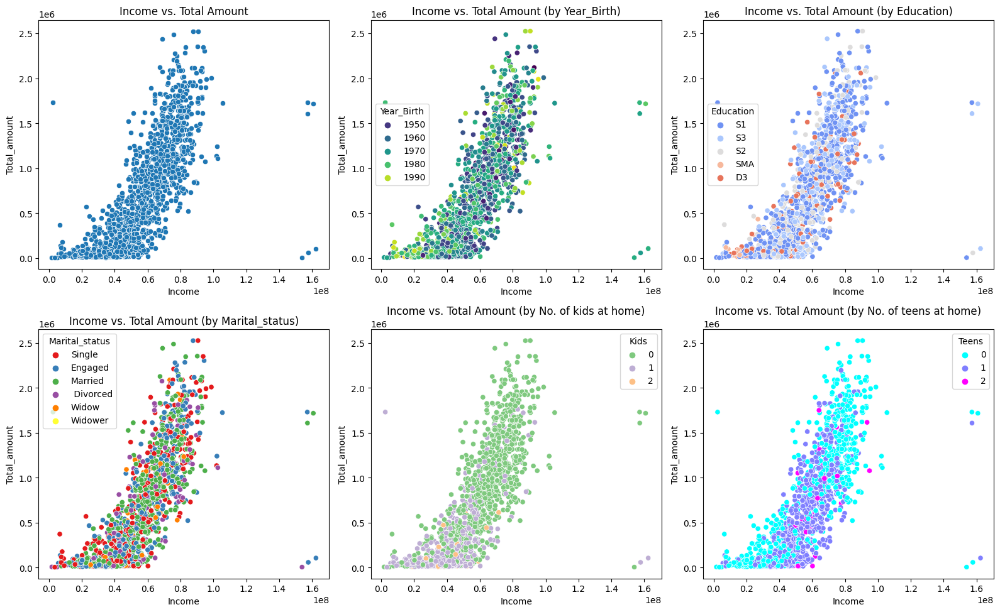

In [39]:
# Create a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Scatter plot for 'Income' vs. 'Total_amount'
sns.scatterplot(x='Income', y='Total_amount', data=df_iqr, ax=axes[0, 0])
axes[0, 0].set(xlabel='Income', ylabel='Total_amount')
axes[0, 0].set_title('Income vs. Total Amount')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Year_Birth'
sns.scatterplot(x='Income', y='Total_amount', hue='Year_Birth', data=df_iqr, ax=axes[0, 1], palette='viridis')
axes[0, 1].set(xlabel='Income', ylabel='Total_amount')
axes[0, 1].set_title('Income vs. Total Amount (by Year_Birth)')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Education'
sns.scatterplot(x='Income', y='Total_amount', hue='Education', data=df_iqr, ax=axes[0, 2], palette='coolwarm')
axes[0, 2].set(xlabel='Income', ylabel='Total_amount')
axes[0, 2].set_title('Income vs. Total Amount (by Education)')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Marital_status'
sns.scatterplot(x='Income', y='Total_amount', hue='Marital_status', data=df_iqr, ax=axes[1, 0], palette='Set1')
axes[1, 0].set(xlabel='Income', ylabel='Total_amount')
axes[1, 0].set_title('Income vs. Total Amount (by Marital_status)')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Kids'
sns.scatterplot(x='Income', y='Total_amount', hue='Kids', data=df_iqr, ax=axes[1, 1], palette='Accent')
axes[1, 1].set(xlabel='Income', ylabel='Total_amount')
axes[1, 1].set_title('Income vs. Total Amount (by No. of kids at home)')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Teens'
sns.scatterplot(x='Income', y='Total_amount', hue='Teens', data=df_iqr, ax=axes[1, 2], palette='cool')
axes[1, 2].set(xlabel='Income', ylabel='Total_amount')
axes[1, 2].set_title('Income vs. Total Amount (by No. of teens at home)')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

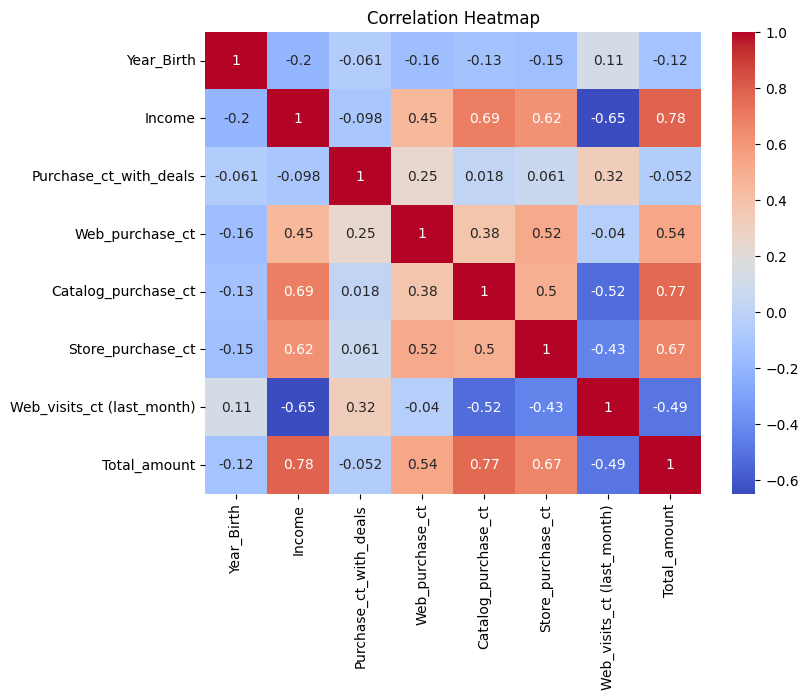

In [40]:
df2 = df_iqr[['Year_Birth', 'Income', 'Purchase_ct_with_deals', 'Web_purchase_ct',
       'Catalog_purchase_ct', 'Store_purchase_ct',
       'Web_visits_ct (last_month)', 'Total_amount']]
corr = df2.corr()

plt.figure(figsize=(8, 6)) 
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

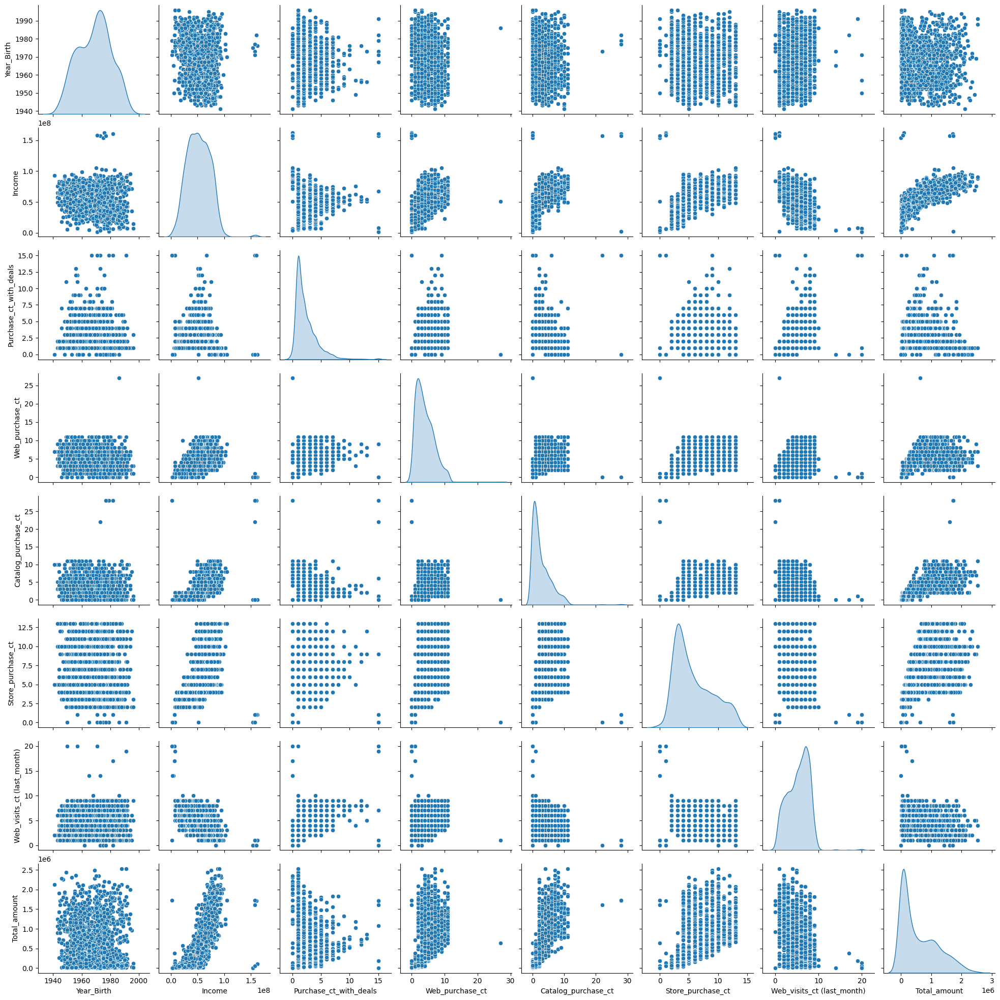

In [41]:
sns.pairplot(df2, diag_kind='kde')
plt.show()

## Customer Behavior:

    What is the distribution of the number of children and teenagers in customer households?
    How long has it been since the customers' last purchase (Recency)?
    What proportion of customers have complained in the last 2 years (Complain)?
    What are the most and least purchased product categories (e.g., Sweets, Fruits)?



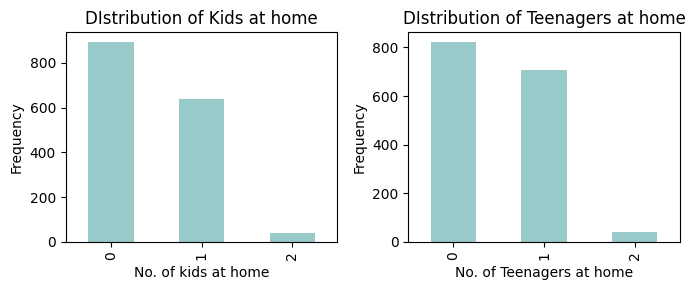

In [42]:
# Create a 2x3 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(7, 3))

df['Kids'].value_counts().plot(kind='bar', color='#98caca', ax=axes[0])
axes[0].set(xlabel='No. of kids at home', ylabel='Frequency')
axes[0].set_title('DIstribution of Kids at home')

df['Teens'].value_counts().plot(kind='bar', color='#98caca', ax=axes[1])
axes[1].set(xlabel='No. of Teenagers at home', ylabel='Frequency')
axes[1].set_title('DIstribution of Teenagers at home')

plt.tight_layout()

plt.show()

<Figure size 300x300 with 0 Axes>

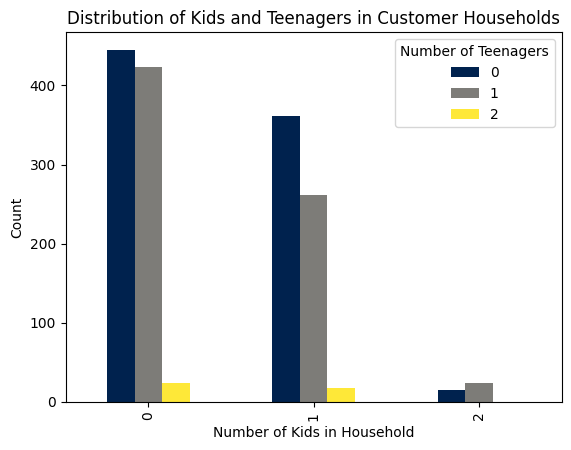

In [43]:
counts = df.groupby(['Kids', 'Teens']).size().unstack()

plt.figure(figsize=(3,3))
counts.plot(kind='bar', cmap='cividis')

plt.title('Distribution of Kids and Teenagers in Customer Households')
plt.xlabel('Number of Kids in Household')
plt.ylabel('Count')
plt.legend(title='Number of Teenagers')

plt.show()

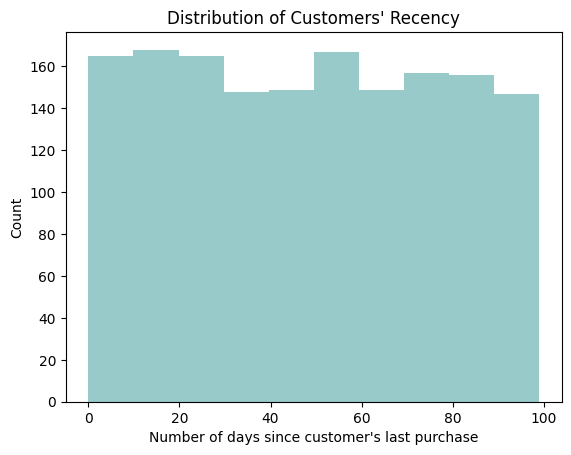

In [44]:
ax = df['Recency'].plot(kind='hist', 
          title="Distribution of Customers' Recency",
          color='#98caca')
ax.set_xlabel("Number of days since customer's last purchase")
ax.set_ylabel('Count')

plt.show()

In [45]:
min = df['Recency'].min()
max = df['Recency'].max()
mean = df['Recency'].mean()
median = df['Recency'].median()
print(f"Minimum of Customers' Recency: {min}")
print(f"Maximum of Customers' Recency: {max}")
print(f"Mean of Customers' Recency: {mean}")
print(f"Median of Customers' Recency: {median}")

Minimum of Customers' Recency: 0
Maximum of Customers' Recency: 99
Mean of Customers' Recency: 48.62444302991725
Median of Customers' Recency: 49.0


In [46]:
count_complain = df_iqr.groupby(['Complain']).size().reset_index(name='count')
count_complain

,Complain,count
0,0,1553
1,1,15


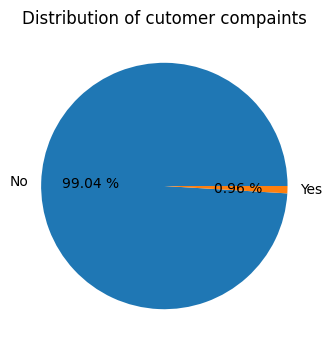

In [47]:
plt.figure(figsize=(4,4))

label = ['No', 'Yes']
count = count_complain['count']
plt.pie(count, labels=label, autopct='%.2f %%')

plt.title('Distribution of cutomer compaints')

plt.show()

In [48]:
prods = ['Coke', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']
count = []

for prod in prods:
    count.append(df_iqr.loc[df_iqr[prod]>0, prod].size)

prod_count = pd.DataFrame([prods, count], index=['Products', 'Count']).T
prod_count

,Products,Count
0,Coke,1560
1,Fruits,1280
2,Meat,1568
3,Fish,1299
4,Sweets,1272
5,Gold,1525


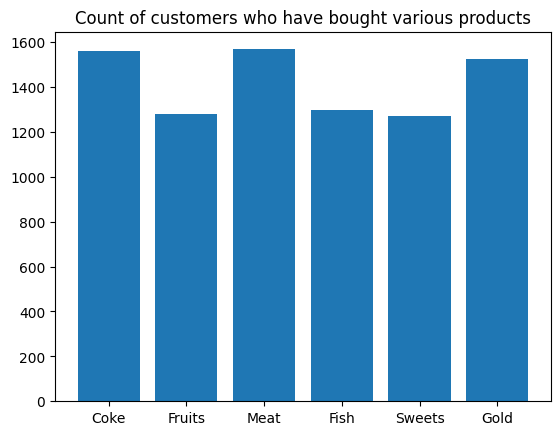

In [49]:
plt.bar(prod_count['Products'], prod_count['Count'])
plt.title('Count of customers who have bought various products')
plt.show()

In [50]:
amt = []
for prod in prods:
    amt.append(df_iqr[prod].sum())

prod_amt = pd.DataFrame([prods, amt], index=['Products', 'Amount']).T
prod_amt

,Products,Amount
0,Coke,474938000
1,Fruits,40298000
2,Meat,258893000
3,Fish,57274000
4,Sweets,42187000
5,Gold,66948000


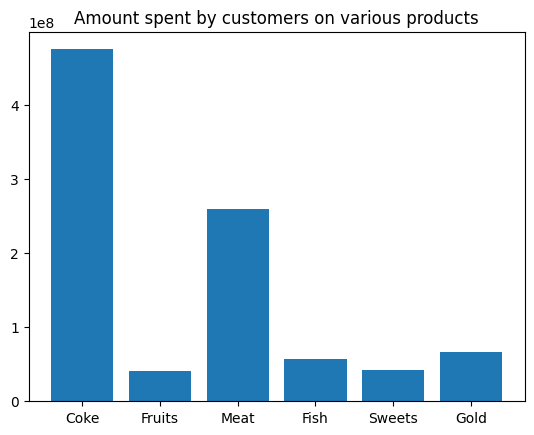

In [51]:
plt.bar(prod_amt['Products'], prod_amt['Amount'])
plt.title('Amount spent by customers on various products')
plt.show()

## Campaign Effectiveness:

- How many customers accepted each of the five different marketing campaigns?
- How many customers responded positively to the last campaign (Response)?
- Is there any correlation between campaign acceptance and other customer attributes?

In [56]:
campaigns = ['Campaign 1', 'Campaign 2', 'Campaign 3', 'Campaign 4', 'Campaign 5', 'Last Campaign']
cols_to_count = ['Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response']
counts = []

for col in cols_to_count:
    counts.append(df.loc[df[col] == 1, col].value_counts())
    
my_dict = {campaigns[i]: counts[i] for i in range(len(campaigns))}
    
df_campaign = pd.DataFrame(my_dict).T.rename(columns={1: 'Count'})
df_campaign

,Count
Campaign 1,97
Campaign 2,18
Campaign 3,111
Campaign 4,119
Campaign 5,104
Last Campaign,229


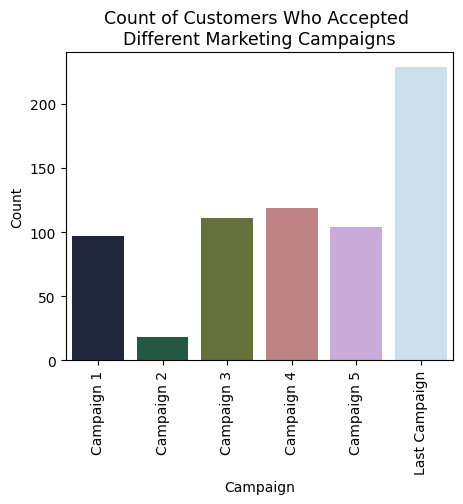

In [57]:
plt.figure(figsize=(5, 4), dpi=100)
sns.barplot(x=df_campaign.index, 
            y="Count",  
            data=df_campaign,
            palette='cubehelix')

plt.xlabel("Campaign")
plt.ylabel("Count")
plt.title("Count of Customers Who Accepted \nDifferent Marketing Campaigns", fontsize=12.5)
plt.xticks(rotation=90)

plt.show()

In [59]:
i = df.loc[df['Response'] == 1, 'Response'].value_counts().iloc[0]
print(f"Count of customers who responded positively to the last campaign: {i}")

Count of customers who responded positively to the last campaign: 229


Effect of different campaigns on each products by various customer features


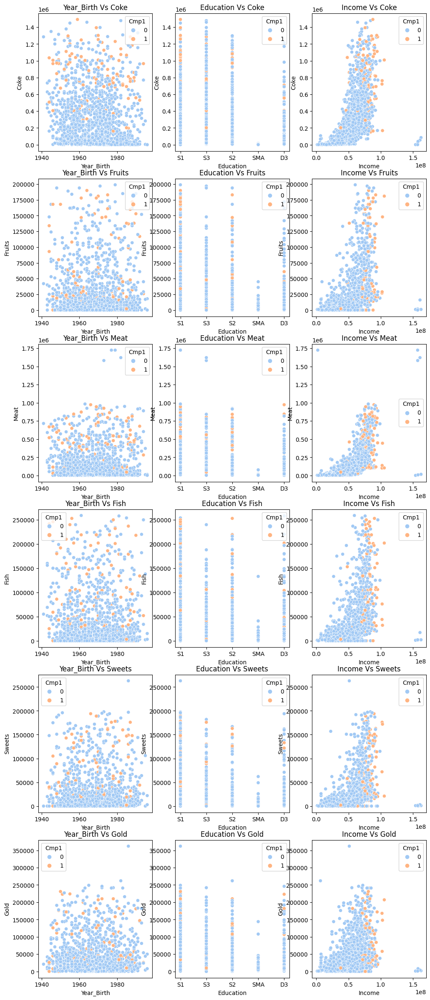

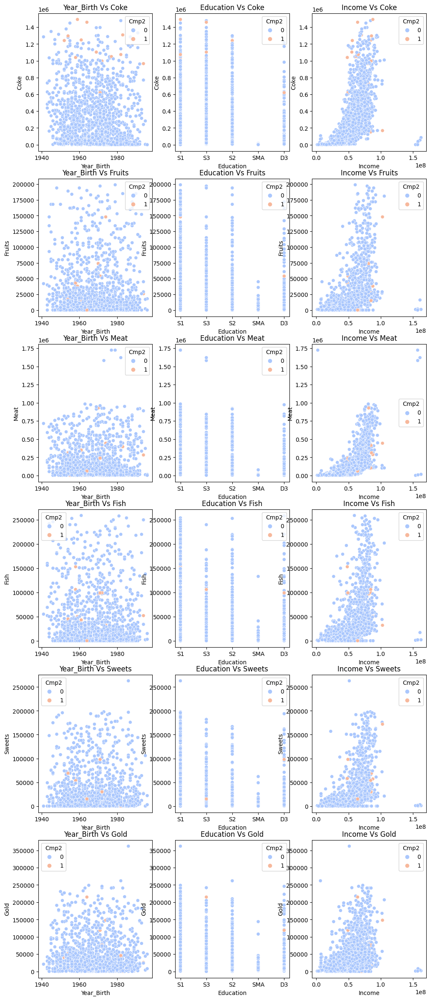

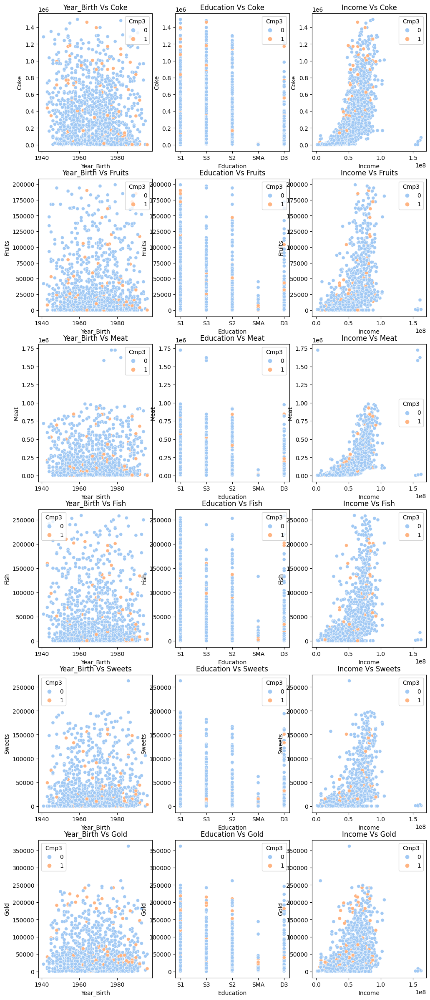

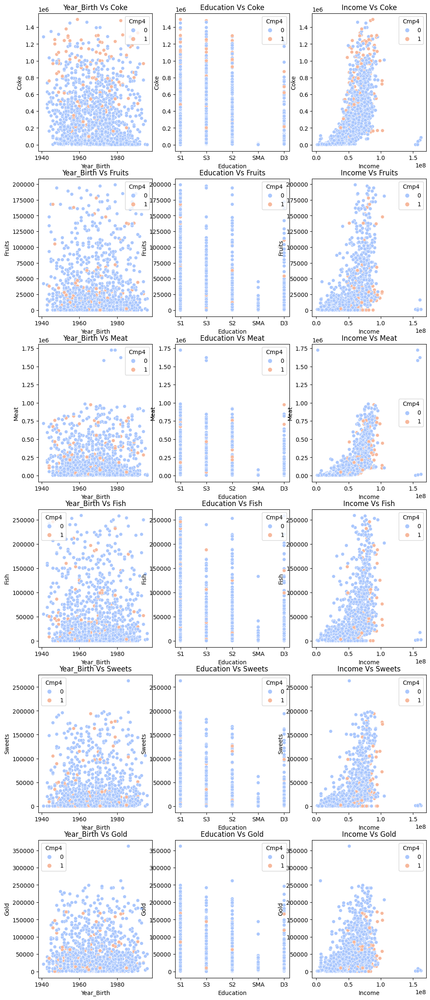

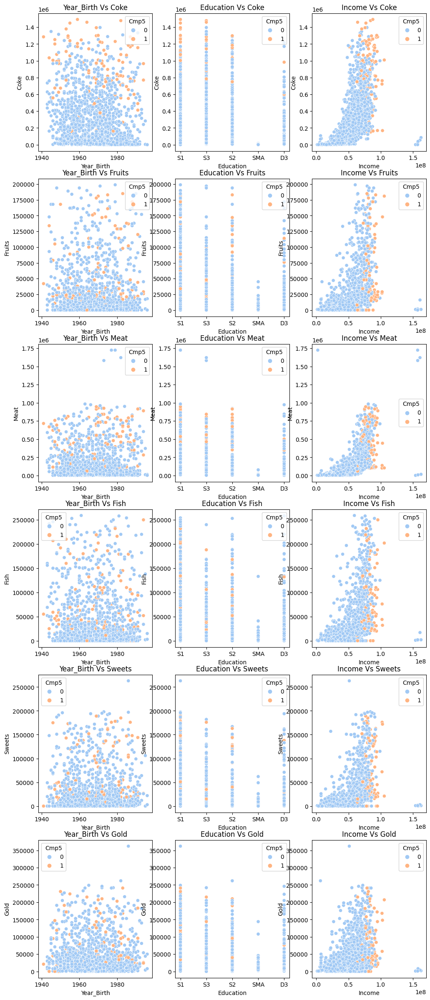

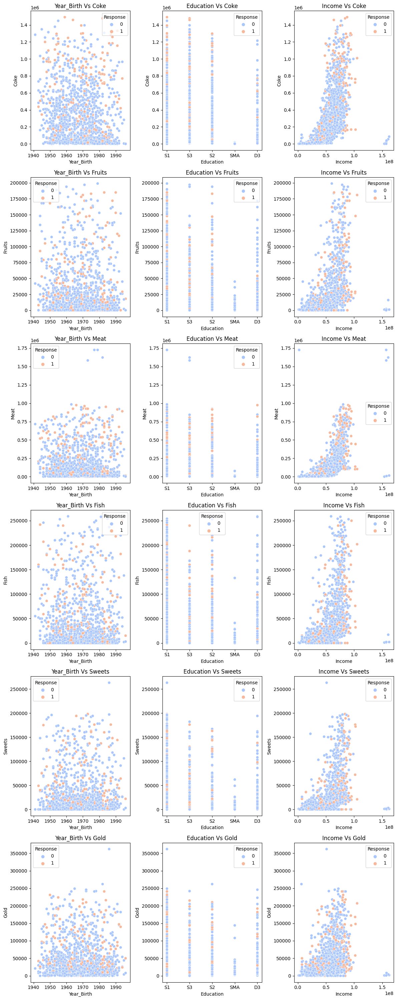

In [60]:
print("Effect of different campaigns on each products by various customer features")
cust_features = ['Year_Birth', 'Education', 'Income']
prods = ['Coke', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']
cmps = ['Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response']
cmaps = ['pastel', 'coolwarm', 'pastel', 'coolwarm', 'pastel', 'coolwarm']

for cmp in cmps:
    # Create a 6x6 grid of subplots
    fig, axes = plt.subplots(6, 3, figsize=(12, 30))
    for feature in cust_features:
        for prod in prods:
            sns.scatterplot(x=feature, y=prod, hue=cmp, data=df_iqr, palette=cmaps[cmps.index(cmp)], ax=axes[prods.index(prod), cust_features.index(feature)])
            axes[prods.index(prod), cust_features.index(feature)].set_title(f'{feature} Vs {prod}')


# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

Campaigns 3, 4, and the last campaign are accepted by customers of all income levels, unlike all other campaigns where only high-income customers seem to have accepted them. 


## Purchase Channels:

    Which channel (NumWebPurchases, NumCatalogPurchases, NumStorePurchases) is the most popular among customers?
    Are there any trends in the number of web visits per month (NumWebVisitsMonth)?



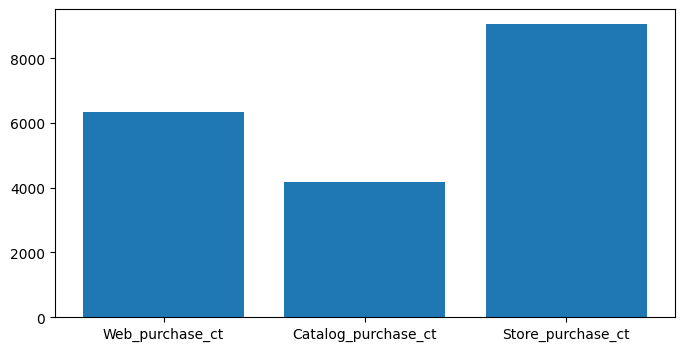

In [61]:
plt.figure(figsize=(8,4))

x = ['Web_purchase_ct', 'Catalog_purchase_ct', 'Store_purchase_ct']
plt.bar(x, [df[i].sum() for i in x])

plt.show()

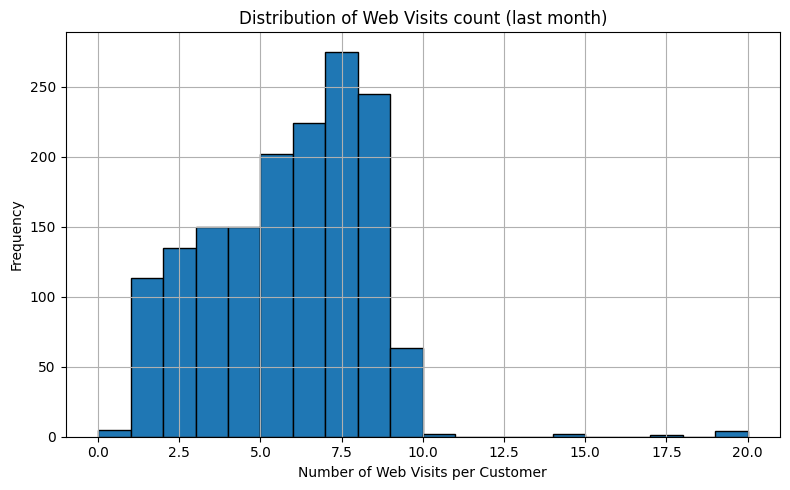

In [62]:
plt.figure(figsize=(8, 5))

plt.hist(df['Web_visits_ct (last_month)'], bins=20, edgecolor='black')

plt.xlabel('Number of Web Visits per Customer')
plt.ylabel('Frequency')
plt.title('Distribution of Web Visits count (last month)')


plt.grid(True)
plt.tight_layout()

plt.show()


## Spending Patterns:

    What is the distribution of spending on different product categories (e.g., MntMeatProducts, MntFishProducts)?
    Is there a relationship between income (Income) and spending on specific product categories?



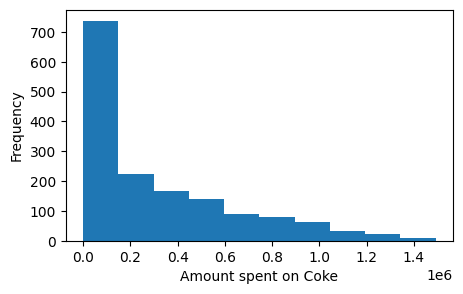

Minimum amount spent on Coke: 0
Maximum amount spent on Coke: 1492000
Mean of amount spent on Coke: 302810.95
Median amount spent on Coke: 172000.0
Total amount spent on Coke: 475716000
Count of customers who have bought Coke: 1563


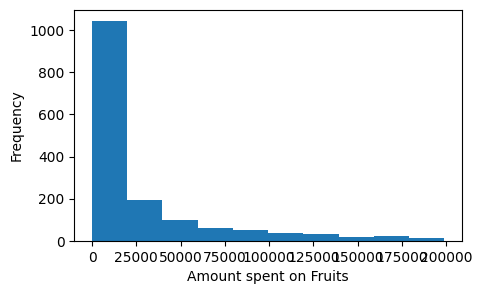

Minimum amount spent on Fruits: 0
Maximum amount spent on Fruits: 199000
Mean of amount spent on Fruits: 25746.66
Median amount spent on Fruits: 8000.0
Total amount spent on Fruits: 40448000
Count of customers who have bought Fruits: 1282


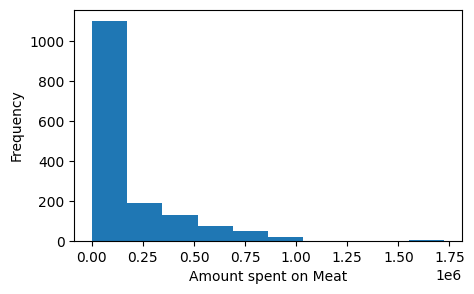

Minimum amount spent on Meat: 1000
Maximum amount spent on Meat: 1725000
Mean of amount spent on Meat: 165161.04
Median amount spent on Meat: 67000.0
Total amount spent on Meat: 259468000
Count of customers who have bought Meat: 1571


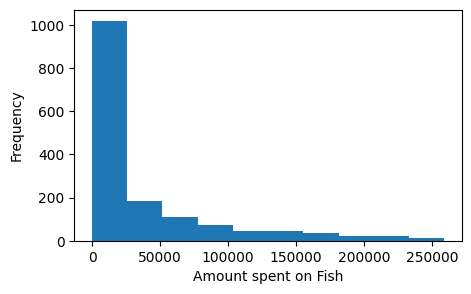

Minimum amount spent on Fish: 0
Maximum amount spent on Fish: 259000
Mean of amount spent on Fish: 36532.15
Median amount spent on Fish: 12000.0
Total amount spent on Fish: 57392000
Count of customers who have bought Fish: 1302


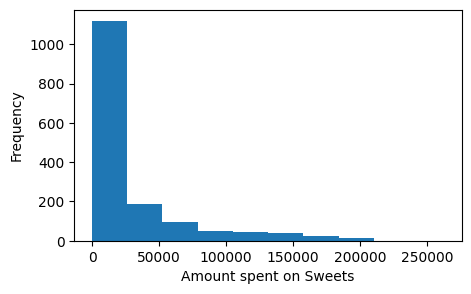

Minimum amount spent on Sweets: 0
Maximum amount spent on Sweets: 263000
Mean of amount spent on Sweets: 26896.88
Median amount spent on Sweets: 8000.0
Total amount spent on Sweets: 42255000
Count of customers who have bought Sweets: 1274


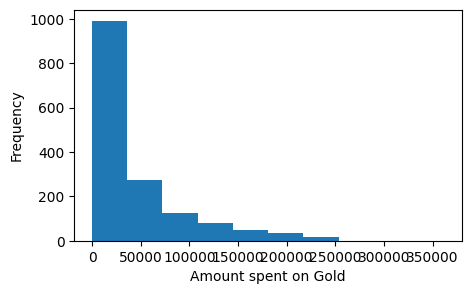

Minimum amount spent on Gold: 0
Maximum amount spent on Gold: 362000
Mean of amount spent on Gold: 42774.67
Median amount spent on Gold: 24000.0
Total amount spent on Gold: 67199000
Count of customers who have bought Gold: 1528


In [63]:
for prod in prods:
    plt.figure(figsize=(5,3))
    plt.hist(df[prod])
    plt.xlabel(f'Amount spent on {prod}')
    plt.ylabel('Frequency')
    plt.show()
    print(f"Minimum amount spent on {prod}:", df[prod].min())
    print(f"Maximum amount spent on {prod}:", df[prod].max())
    print(f"Mean of amount spent on {prod}:", round(df[prod].mean(),2))
    print(f"Median amount spent on {prod}:", df[prod].median())
    print(f"Total amount spent on {prod}:", df[prod].sum())
    print(f"Count of customers who have bought {prod}:", df.loc[df[prod] >0, prod].shape[0])

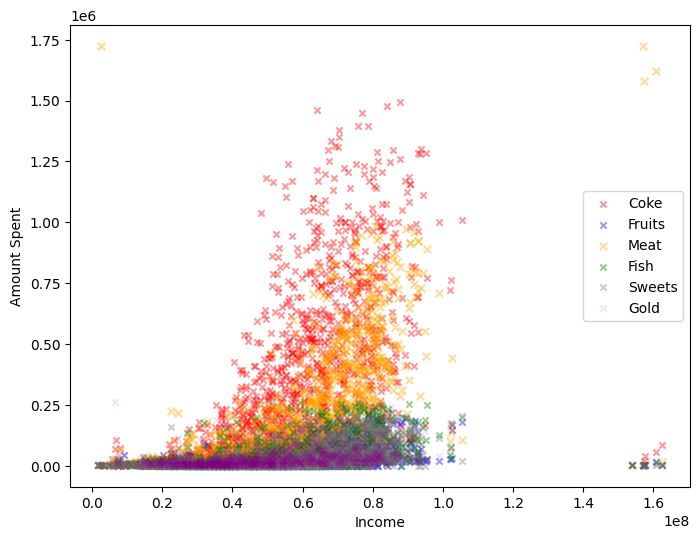

In [64]:
plt.figure(figsize=(8, 6))

plt.scatter(df_iqr['Income'], df_iqr['Coke'], c='red', alpha=.4, s=20, marker='x')
plt.scatter(df_iqr['Income'], df_iqr['Fruits'], c='blue', alpha=.4, s=20, marker='x')
plt.scatter(df_iqr['Income'], df_iqr['Meat'], c='orange', alpha=.4, s=30, marker='x')
plt.scatter(df_iqr['Income'], df_iqr['Fish'], c='green', alpha=.4, s=20, marker='x')
plt.scatter(df_iqr['Income'], df_iqr['Sweets'], c='grey', alpha=.4, s=20, marker='x')
plt.scatter(df_iqr['Income'], df_iqr['Gold'], c='purple', alpha=.1, s=20, marker='x')

plt.xlabel("Income")
plt.ylabel("Amount Spent")

plt.legend(['Coke', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold'])
plt.show()



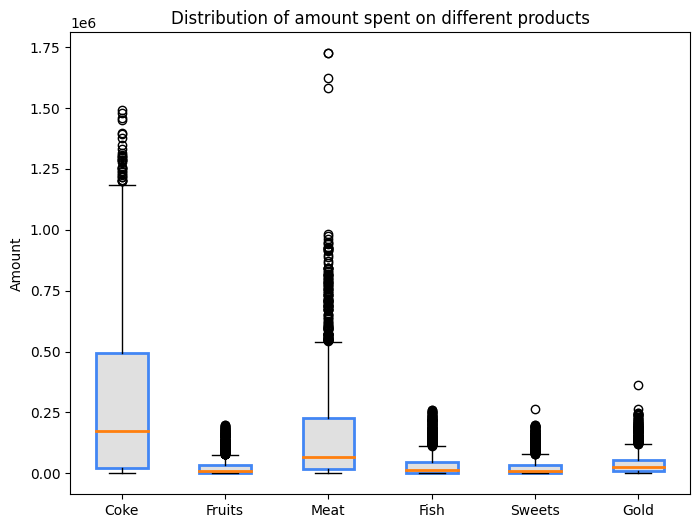

In [65]:
plt.figure(figsize=(8,6), dpi=100)

coke = df_iqr['Coke']
fruits = df_iqr['Fruits']
meat = df_iqr['Meat']
fish = df_iqr['Fish']
sweets = df_iqr['Sweets']
gold = df_iqr['Gold']

labels = ["Coke", "Fruits", "Meat", "Fish", "Sweets", "Gold"]
          
bp = plt.boxplot([coke, fruits, meat, fish, sweets, gold],
                 labels=labels,
                 patch_artist=True, 
                 medianprops={'linewidth': 2})

plt.title('Distribution of amount spent on different products')
plt.ylabel('Amount')

for box in bp['boxes']:
    box.set(color='#4286f4', linewidth=2)
    box.set(facecolor = '#e0e0e0')
    
plt.show()

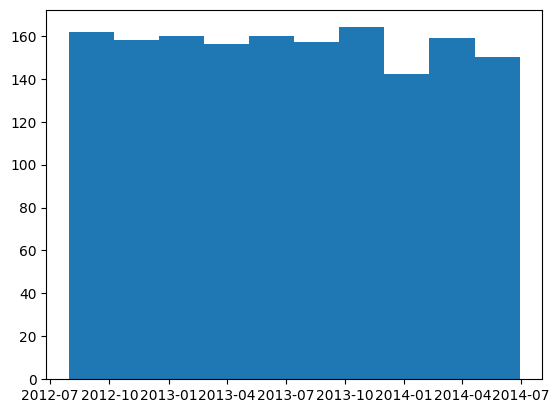

In [66]:
plt.hist(df_iqr.Enrollment_date)
plt.show()



In [67]:
df_iqr.drop(columns=['Recency', 'Enrollment_date', 'Total_amount'], inplace=True)

C:\Users\franc\AppData\Local\Temp\ipykernel_20412\1356731796.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iqr.drop(columns=['Recency', 'Enrollment_date', 'Total_amount'], inplace=True)


## Encoding

In [68]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

cols_to_encode = ['Education', 'Marital_status']
for col in cols_to_encode:
    df_iqr.loc[:, col] = label_encoder.fit_transform(df_iqr[col])
    
df_iqr.head()

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Coke,Fruits,Meat,Fish,...,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
0,1957,1,3,58138000.0,0,0,635000,88000,546000,172000,...,10,4,7,0,0,0,0,0,0,1
1,1954,1,3,46344000.0,1,1,11000,1000,6000,2000,...,1,2,5,0,0,0,0,0,0,0
2,1965,1,1,71613000.0,0,0,426000,49000,127000,111000,...,2,10,4,0,0,0,0,0,0,0
3,1984,1,1,26646000.0,1,0,11000,4000,20000,10000,...,0,4,6,0,0,0,0,0,0,0
4,1981,3,2,58293000.0,1,0,173000,43000,118000,46000,...,3,6,5,0,0,0,0,0,0,0


In [69]:
df_iqr.shape

(1568, 24)

In [70]:


df_iqr.dropna(inplace=True)



C:\Users\franc\AppData\Local\Temp\ipykernel_20412\904568183.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iqr.dropna(inplace=True)


In [71]:
df_iqr.shape

(1568, 24)

In [72]:


df_iqr.info()



<class 'pandas.core.frame.DataFrame'>
Index: 1568 entries, 0 to 1570
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Year_Birth                  1568 non-null   int64  
 1   Education                   1568 non-null   object 
 2   Marital_status              1568 non-null   object 
 3   Income                      1568 non-null   float64
 4   Kids                        1568 non-null   int64  
 5   Teens                       1568 non-null   int64  
 6   Coke                        1568 non-null   int64  
 7   Fruits                      1568 non-null   int64  
 8   Meat                        1568 non-null   int64  
 9   Fish                        1568 non-null   int64  
 10  Sweets                      1568 non-null   int64  
 11  Gold                        1568 non-null   int64  
 12  Purchase_ct_with_deals      1568 non-null   int64  
 13  Web_purchase_ct             1568 non-n

In [73]:
df_iqr['Education'] = pd.to_numeric(df_iqr['Education'])
df_iqr['Marital_status'] = pd.to_numeric(df_iqr['Marital_status'])

C:\Users\franc\AppData\Local\Temp\ipykernel_20412\1248801881.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iqr['Education'] = pd.to_numeric(df_iqr['Education'])
C:\Users\franc\AppData\Local\Temp\ipykernel_20412\1248801881.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iqr['Marital_status'] = pd.to_numeric(df_iqr['Marital_status'])


In [74]:


df_iqr.loc[:, ['Education', 'Marital_status']].dtypes



Education         int64
Marital_status    int64
dtype: object

## Feature scaling

In [75]:
from sklearn.preprocessing import StandardScaler
df_scaled = df_iqr.copy()

scaler = StandardScaler()

for col in df_iqr:
    scaler.fit(df_scaled[[col]])
    df_scaled.loc[:, col] = scaler.transform(df_iqr[[col]])
    
df_scaled.head()

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Coke,Fruits,Meat,Fish,...,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
0,-1.030138,-0.582681,1.175228,0.289982,-0.837768,-0.915618,0.986556,1.583097,1.692139,2.510710,...,2.466707,-0.549834,0.675722,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,2.418090
1,-1.288358,-0.582681,1.175228,-0.262022,0.994339,0.899412,-0.867103,-0.627657,-0.706863,-0.639881,...,-0.556584,-1.167413,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549
2,-0.341549,-0.582681,-0.818020,0.920664,-0.837768,-0.915618,0.365699,0.592069,-0.169309,1.380204,...,-0.220663,1.302902,-0.545406,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549
3,1.293848,-0.582681,-0.818020,-1.183964,0.994339,-0.915618,-0.867103,-0.551425,-0.644667,-0.491618,...,-0.892505,-0.549834,0.268679,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549
4,1.035627,1.416540,0.178604,0.297237,0.994339,-0.915618,-0.385864,0.439603,-0.209292,0.175566,...,0.115259,0.067745,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549


## KMeans
Perform elbow method to find optimal no of clusters

In [76]:
from sklearn.cluster import KMeans

In [77]:
wcss = []     
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, n_init='auto', init='k-means++', random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

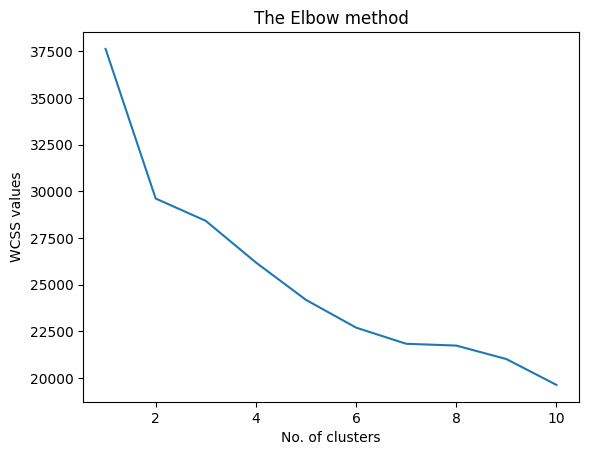

In [78]:
plt.plot(range(1,11), wcss)
plt.title('The Elbow method')
plt.xlabel('No. of clusters')
plt.ylabel('WCSS values')
plt.show()

In [79]:
km = KMeans(n_clusters = 7)
y_predicted = km.fit_predict(df_scaled)
y_predicted

C:\Users\franc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


array([4, 1, 4, ..., 1, 1, 1])

In [80]:
from sklearn.metrics import silhouette_samples, silhouette_score
silhouette_avg = silhouette_score(df_scaled, y_predicted)
silhouette_avg

0.18356026172152767

# t-SNE

In [81]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=35, n_iter=300, random_state=42)
df_tsne = tsne.fit_transform(df_scaled)
    
df_tsne



array([[ 8.967053  , -4.18335   ],
       [-3.1686437 ,  8.073989  ],
       [ 4.864533  , -3.704755  ],
       ...,
       [-5.1272326 , -1.7201071 ],
       [-5.0985336 , -0.47678947],
       [-9.040061  , -3.1726024 ]], dtype=float32)

In [82]:
df_tsne.shape

(1568, 2)

In [83]:
df_tsne = pd.DataFrame(data=df_tsne, columns=['component 1', 'component 2'])
df_tsne.head()

,component 1,component 2
0,8.967053,-4.183350
1,-3.168644,8.073989
2,4.864533,-3.704755
3,-9.626536,-0.406076
4,-4.734701,0.055941


In [84]:


df_scaled.iloc[:5, :24]



,Year_Birth,Education,Marital_status,Income,Kids,Teens,Coke,Fruits,Meat,Fish,...,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
0,-1.030138,-0.582681,1.175228,0.289982,-0.837768,-0.915618,0.986556,1.583097,1.692139,2.510710,...,2.466707,-0.549834,0.675722,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,2.418090
1,-1.288358,-0.582681,1.175228,-0.262022,0.994339,0.899412,-0.867103,-0.627657,-0.706863,-0.639881,...,-0.556584,-1.167413,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549
2,-0.341549,-0.582681,-0.818020,0.920664,-0.837768,-0.915618,0.365699,0.592069,-0.169309,1.380204,...,-0.220663,1.302902,-0.545406,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549
3,1.293848,-0.582681,-0.818020,-1.183964,0.994339,-0.915618,-0.867103,-0.551425,-0.644667,-0.491618,...,-0.892505,-0.549834,0.268679,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549
4,1.035627,1.416540,0.178604,0.297237,0.994339,-0.915618,-0.385864,0.439603,-0.209292,0.175566,...,0.115259,0.067745,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549


In [85]:
wcss = []     
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, n_init='auto', init='k-means++', random_state=0)
    kmeans.fit(df_tsne)
    wcss.append(kmeans.inertia_)

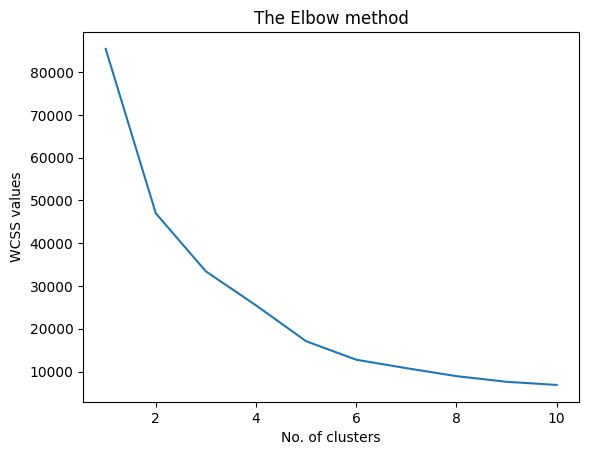

In [86]:
plt.plot(range(1,11), wcss)
plt.title('The Elbow method')
plt.xlabel('No. of clusters')
plt.ylabel('WCSS values')
plt.show()

In [87]:
km = KMeans(n_clusters = 4)
y_predicted = km.fit_predict(df_scaled)
y_predicted

C:\Users\franc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


array([2, 0, 2, ..., 0, 0, 0])

In [88]:
df_scaled.loc[:, 'Cluster_KMeans'] = y_predicted
df_scaled.head()

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Coke,Fruits,Meat,Fish,...,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Cluster_KMeans
0,-1.030138,-0.582681,1.175228,0.289982,-0.837768,-0.915618,0.986556,1.583097,1.692139,2.510710,...,-0.549834,0.675722,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,2.418090,2
1,-1.288358,-0.582681,1.175228,-0.262022,0.994339,0.899412,-0.867103,-0.627657,-0.706863,-0.639881,...,-1.167413,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,0
2,-0.341549,-0.582681,-0.818020,0.920664,-0.837768,-0.915618,0.365699,0.592069,-0.169309,1.380204,...,1.302902,-0.545406,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,2
3,1.293848,-0.582681,-0.818020,-1.183964,0.994339,-0.915618,-0.867103,-0.551425,-0.644667,-0.491618,...,-0.549834,0.268679,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,0
4,1.035627,1.416540,0.178604,0.297237,0.994339,-0.915618,-0.385864,0.439603,-0.209292,0.175566,...,0.067745,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,1


In [90]:
from sklearn.metrics import silhouette_samples, silhouette_score
silhouette_avg = silhouette_score(df_scaled, y_predicted)
silhouette_avg

0.18850917130568592

C:\Users\franc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


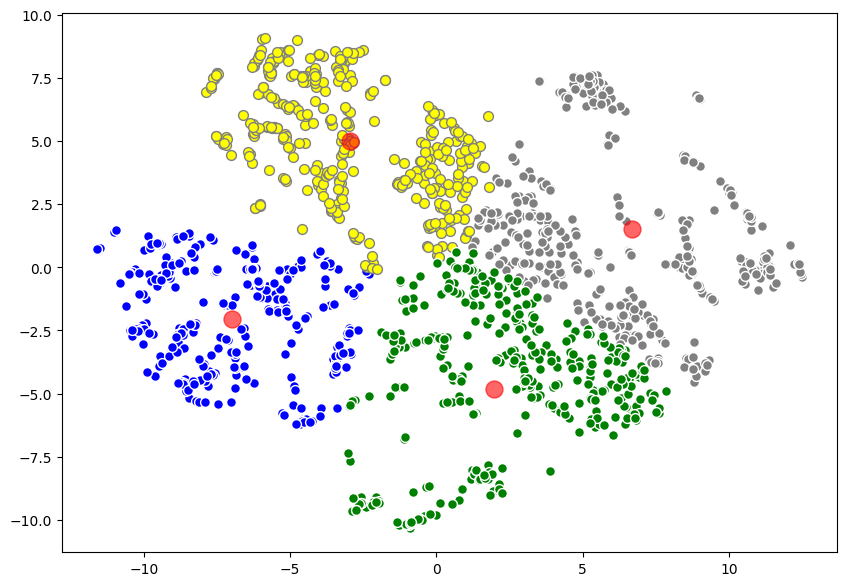

In [91]:
df_tsne['y_km']=km.fit_predict(df_tsne.iloc[:, :2])
plt.figure(figsize=(10,7))


plt.scatter(df_tsne.loc[df_tsne['y_km'] == 0, 'component 1'], df_tsne.loc[df_tsne['y_km'] == 0, 'component 2'], s=50, c='grey', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_km'] == 1, 'component 1'], df_tsne.loc[df_tsne['y_km'] == 1, 'component 2'], s=50, c='blue', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_km'] == 2, 'component 1'], df_tsne.loc[df_tsne['y_km'] == 2, 'component 2'], s=50, c='yellow', edgecolors="grey")
plt.scatter(df_tsne.loc[df_tsne['y_km'] == 3, 'component 1'], df_tsne.loc[df_tsne['y_km'] == 3, 'component 2'], s=50, c='green', edgecolors="white")

plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], s=150, c='red', label='Centroids', alpha=.60)

plt.show()

In [92]:
silhouette_avg = silhouette_score(df_tsne.iloc[:, [0,1]], df_tsne['y_km'])
silhouette_avg

0.39106563

## Dendrogram

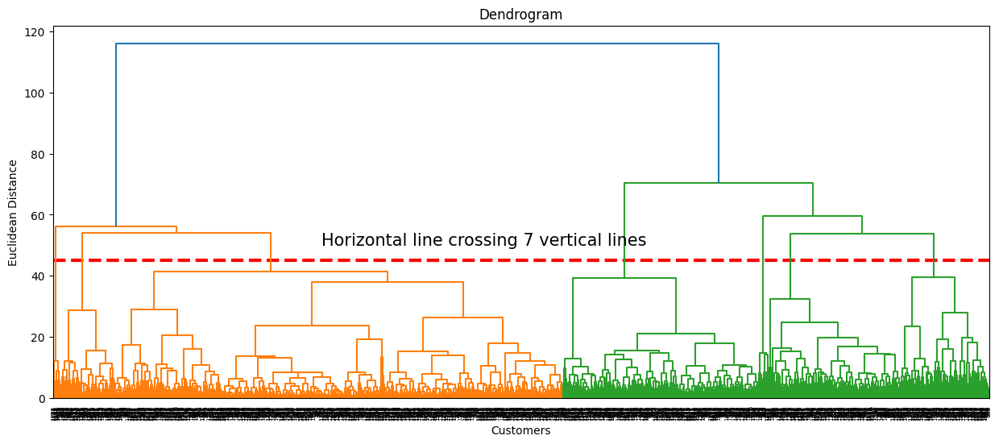

In [93]:
import scipy.cluster.hierarchy as sch

plt.figure(figsize=(15,6))
plt.title('Dendrogram')
plt.xticks([])
plt.xlabel('Customers')
plt.ylabel('Euclidean Distance')

plt.hlines(y=45, xmin=0, xmax=20000, lw=3, linestyle='--', color='red')
plt.text(x=4500, y=50, s="Horizontal line crossing 7 vertical lines", fontsize=15)

dendrogram = sch.dendrogram(sch.linkage(df_scaled.iloc[:, :24], method='ward'))
plt.show()

In [94]:
from sklearn.cluster import AgglomerativeClustering

hc=AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
y_hc=hc.fit_predict(df_scaled.iloc[:, :24])

C:\Users\franc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [95]:
df_scaled.loc[:, 'Cluster_HC'] = y_hc
df_scaled.head()

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Coke,Fruits,Meat,Fish,...,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Cluster_KMeans,Cluster_HC
0,-1.030138,-0.582681,1.175228,0.289982,-0.837768,-0.915618,0.986556,1.583097,1.692139,2.510710,...,0.675722,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,2.418090,2,6
1,-1.288358,-0.582681,1.175228,-0.262022,0.994339,0.899412,-0.867103,-0.627657,-0.706863,-0.639881,...,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,0,0
2,-0.341549,-0.582681,-0.818020,0.920664,-0.837768,-0.915618,0.365699,0.592069,-0.169309,1.380204,...,-0.545406,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,2,6
3,1.293848,-0.582681,-0.818020,-1.183964,0.994339,-0.915618,-0.867103,-0.551425,-0.644667,-0.491618,...,0.268679,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,0,0
4,1.035627,1.416540,0.178604,0.297237,0.994339,-0.915618,-0.385864,0.439603,-0.209292,0.175566,...,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,1,0


C:\Users\franc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


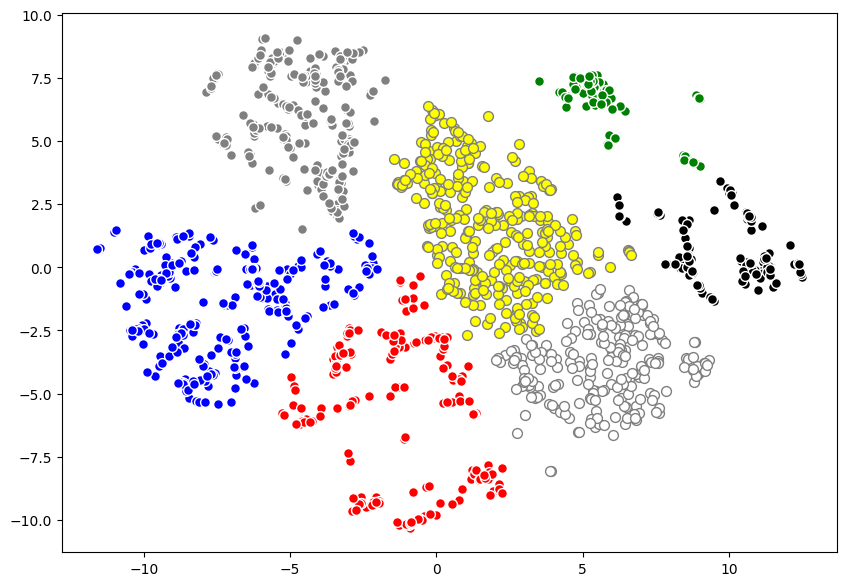

In [96]:
df_tsne['y_hc']=hc.fit_predict(df_tsne)
plt.figure(figsize=(10,7))


plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 0, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 0, 'component 2'], s=50, c='red', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 1, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 1, 'component 2'], s=50, c='blue', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 2, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 2, 'component 2'], s=50, c='yellow', edgecolors="grey")
plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 3, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 3, 'component 2'], s=50, c='green', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 4, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 4, 'component 2'], s=50, c='white', edgecolors="grey")
plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 5, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 5, 'component 2'], s=50, c='grey', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 6, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 6, 'component 2'], s=50, c='black', edgecolors="white")

plt.show()

In [97]:
silhouette_avg = silhouette_score(df_scaled.iloc[:, :24], df_scaled['Cluster_HC'])
silhouette_avg

0.1757003698765412

In [98]:
silhouette_avg = silhouette_score(df_tsne.iloc[:, [0,1]], df_tsne['y_hc'])
silhouette_avg

0.45683178

## Interpretation and analysis of clusters

In [99]:


df_scaled.head()



,Year_Birth,Education,Marital_status,Income,Kids,Teens,Coke,Fruits,Meat,Fish,...,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Cluster_KMeans,Cluster_HC
0,-1.030138,-0.582681,1.175228,0.289982,-0.837768,-0.915618,0.986556,1.583097,1.692139,2.510710,...,0.675722,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,2.418090,2,6
1,-1.288358,-0.582681,1.175228,-0.262022,0.994339,0.899412,-0.867103,-0.627657,-0.706863,-0.639881,...,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,0,0
2,-0.341549,-0.582681,-0.818020,0.920664,-0.837768,-0.915618,0.365699,0.592069,-0.169309,1.380204,...,-0.545406,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,2,6
3,1.293848,-0.582681,-0.818020,-1.183964,0.994339,-0.915618,-0.867103,-0.551425,-0.644667,-0.491618,...,0.268679,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,0,0
4,1.035627,1.416540,0.178604,0.297237,0.994339,-0.915618,-0.385864,0.439603,-0.209292,0.175566,...,-0.138363,-0.276014,-0.286576,-0.265155,-0.256791,-0.107763,-0.098279,-0.413549,1,0


In [100]:
df_scaled.drop(['Cluster_HC'], axis=1, inplace=True)

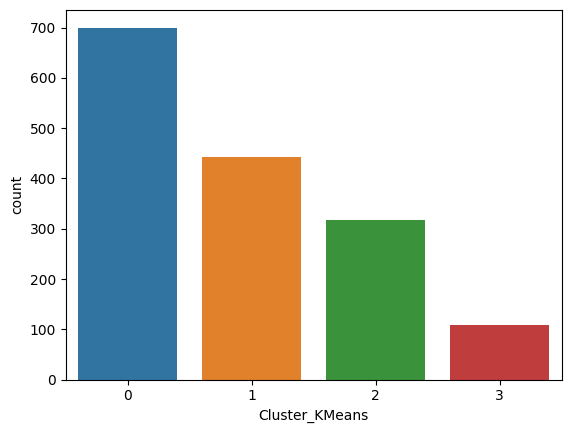

In [101]:
sns.countplot(x=df_scaled['Cluster_KMeans'])
plt.show()

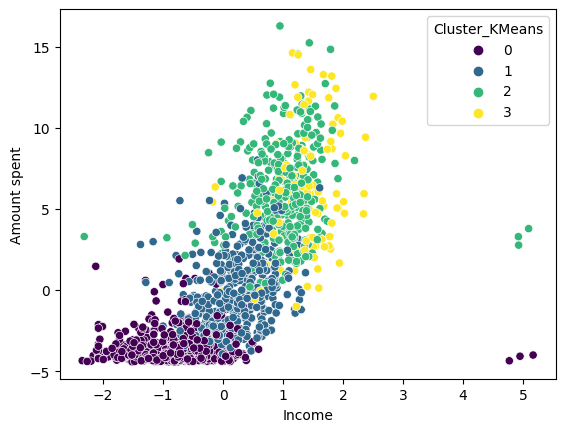

In [102]:
sns.scatterplot(x=df_scaled['Income'], 
                y=df_scaled['Coke']+df_scaled['Fruits']+df_scaled['Meat']+df_scaled['Fish']+df_scaled['Sweets']+df_scaled['Gold'], 
                hue=df_scaled['Cluster_KMeans'],
               palette='viridis')
plt.ylabel('Amount spent')

plt.show()

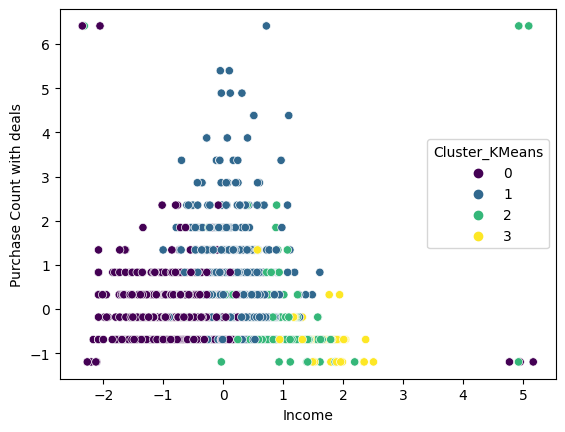

In [103]:
sns.scatterplot(x=df_scaled['Income'], 
                y=df_scaled['Purchase_ct_with_deals'], 
                hue=df_scaled['Cluster_KMeans'],
               palette='viridis')
plt.ylabel('Purchase Count with deals')

plt.show()


## Classification
Extracting dependant and independant variables

In [105]:
x = df_scaled.iloc[:, :-1]
y = df_scaled.iloc[:, -1]




In [106]:
# Splitting the dataset into train and test

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)



# Random forest

In [107]:


from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rclf = RandomForestClassifier(n_estimators=100, max_features="sqrt", random_state=0)
rclf.fit(x_train, y_train)
y_pred = rclf.predict(x_test)
accuracy_score(y_test, y_pred)


0.9394904458598726

# SVM

In [108]:
from sklearn.svm import SVC

In [109]:
model = SVC(kernel='linear', C=1)
model.fit(x_train, y_train)
y_pred=model.predict(x_test)
accuracy_score(y_test, y_pred)

0.9840764331210191

# KNN

In [119]:
x1 = x.values
y1 = y.values

In [121]:
from sklearn.model_selection import train_test_split
x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size=0.2, random_state=0)

In [124]:
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier


In [125]:
Ks = 20
accuracy_rate = []
for n in range(1, Ks):
    neigh = KNeighborsClassifier(n_neighbors = n).fit(x1_train, y1_train)
    score = cross_val_score(neigh, x1, y1, cv=10)
    accuracy_rate.append(score.mean())

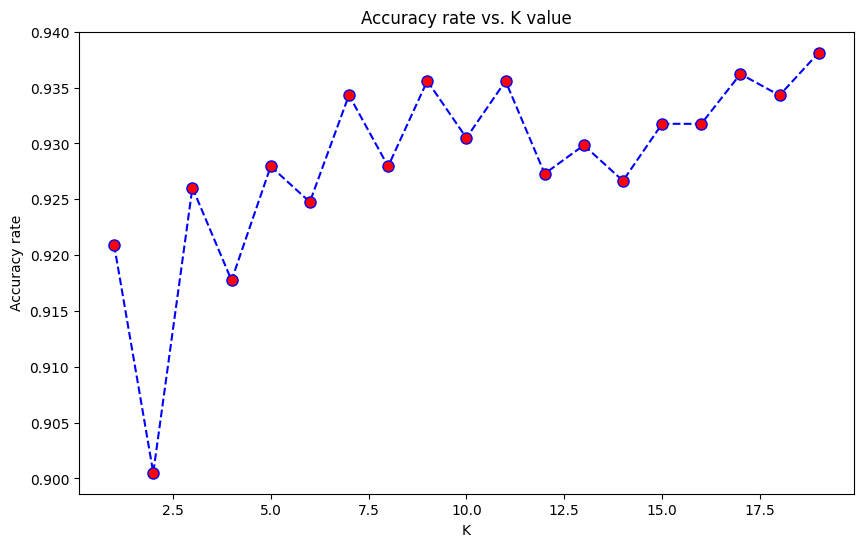

In [126]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, 20), accuracy_rate, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=8)
plt.title('Accuracy rate vs. K value')
plt.xlabel('K')
plt.ylabel('Accuracy rate')
plt.show()

In [127]:
k = 7
neigh = KNeighborsClassifier(n_neighbors = k, metric='euclidean').fit(x1_train, y1_train)
neigh

KNeighborsClassifier(metric='euclidean', n_neighbors=7)

# Evaluation 

In [128]:
from sklearn.metrics import accuracy_score, classification_report
pred = neigh.predict(x1_test)
s1 = accuracy_score(y1_test, pred)
s1

0.9363057324840764

In [129]:
print(classification_report(y1_test, pred))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       150
           1       0.89      0.91      0.90        91
           2       0.98      0.88      0.92        49
           3       0.96      0.96      0.96        24

    accuracy                           0.94       314
   macro avg       0.94      0.93      0.94       314
weighted avg       0.94      0.94      0.94       314

